<center>
<img src="https://drive.google.com/uc?id=1f1gGVI-rxcHjA90WEGNvvtSXF1pAxQwg" alt="Fasilkom UI" width="300"/>

CSGE603130 • Kecerdasan Artifisial dan Sains Data Dasar

Semester Ganjil 2022/2023

Fakultas Ilmu Komputer, Universitas Indonesia

##**Tugas *2*: *Classification***

###**Tenggat Waktu: 19 November 2022, 23.55 WIB**
</center>

####**Ketentuan:**

1. Dataset yang digunakan pada tugas ini beserta deskripsinya telah disediakan di SCeLe.
2. Buatlah program Jupyter Notebook yang menjawab pertanyaan sesuai dengan perintah soal yang disediakan.
3. Dokumen Jupyter Notebook yang telah dilengkapi dengan jawaban dikumpulkan dengan format penamaan **Kelas_Tugas2_NPM_Nama.ipynb**. Contoh: A_Tugas2_2006123456_Budi.ipynb
4. Kumpulkan dokumen tersebut pada submisi yang telah disediakan di SCeLe sesuai dengan kelas masing-masing sebelum **19 November 2022, 23.55 WIB**. Keterlambatan pengumpulan akan dikenakan pinalti.
5. Praktikum ini dirancang sebagai **tugas mandiri**. Plagiarisme tidak diperkenankan dalam bentuk apapun. Adapun kolaborasi berupa diskusi (tanpa menyalin) dan literasi masih diperbolehkan dengan mencantumkan kolaborator dan sumber.


## **Pernyataan Integritas**

Wajib diisi. Tanpa pernyataan integritas submisi akan dikenakan pinalti.

In [1]:
# Isi dengan data diri Anda
NAMA = "Yosabad Torando Sirait"
KELAS = "C"
NPM = "2006597046"

# Isi dengan NPM teman yang berdiskusi dengan Anda
KOLABORATOR = []

# Isi dengan sumber referensi yang Anda gunakan dalam mengerjakan
REFERENSI = []

In [2]:
PERNYATAAN_INTEGRITAS = "Saya, %s dari kelas %s dengan NPM %s, menyatakan bahwa seluruh jawaban pada pekerjaan ini murni saya kerjakan sendiri.\n\
Saya tidak mencontek jawaban, memberikan jawaban, maupun menyalin dari sumber manapun.\n \
\n\
Jika saya melanggar pernyataan tersebut, saya siap menerima konsekuensi apapun yang diberikan.\n   \
(%s)" % (NAMA, KELAS, NPM, NAMA)

print(PERNYATAAN_INTEGRITAS)

Saya, Yosabad Torando Sirait dari kelas C dengan NPM 2006597046, menyatakan bahwa seluruh jawaban pada pekerjaan ini murni saya kerjakan sendiri.
Saya tidak mencontek jawaban, memberikan jawaban, maupun menyalin dari sumber manapun.
 
Jika saya melanggar pernyataan tersebut, saya siap menerima konsekuensi apapun yang diberikan.
   (Yosabad Torando Sirait)


In [3]:
# Import libraries
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd

from sklearn.ensemble import RandomForestClassifier
from sklearn.feature_selection import SelectKBest, f_classif
from sklearn.metrics import classification_report, accuracy_score
from sklearn.model_selection import GridSearchCV, train_test_split, KFold, cross_val_score
from sklearn.naive_bayes import GaussianNB, MultinomialNB, ComplementNB, BernoulliNB, CategoricalNB
from sklearn.neighbors import KNeighborsClassifier
from sklearn.preprocessing import MinMaxScaler, LabelEncoder, OneHotEncoder
from sklearn.tree import DecisionTreeClassifier

## **Dataset**

Dataset yang digunakan adalah dataset Mobile Prices dimana kita memklasifikasi handphone lewat harganya, terdapat 21 atribut dan target atributnya adalah price_range.

Penjelesan atribut:
* battery_power : Total energy a battery can store in one time measured in mAh
* blue : Has bluetooth or not
* clock_speed : speed at which microprocessor executes instructions
* dual_sim : Has dual sim support or not
* fc : Front Camera mega pixels
* four_g : Has 4G or not
* int_memory : Internal Memory in Gigabytes
* m_dep : Mobile Depth in cm
* mobile_wt : Weight of mobile phone
* n_cores : Number of cores of processor
* pc : Primary Camera mega pixels
* px_height : Pixel Resolution Height
* px_width : Pixel Resolution Width
* ram : Random Access Memory in Mega Bytes
* sc_h : Screen Height of mobile in cm
* sc_w : Screen Width of mobile in cm
* talk_time : Longest time that a single battery charge will last when you are
* three_g : Has 3G or not
* touch_screen : Has touch screen or not
* wifi : Has wifi or not
* price_range : This is the target variable with value of 0(low cost), 1(medium cost), 2(high cost) and 3(very high cost).

Sumber: https://www.kaggle.com/datasets/iabhishekofficial/mobile-price-classification (dengan modifikasi)

## [25] **Preprocessing**

**Pada bagian ini Anda akan diminta untuk melakukan preprocessing dan eksplorasi data sebelum data digunakan dalam model klasifikasi.**

1\. [3] Berikan ringkasan mengenai data tersebut terkait dengan deskripsi setiap atribut, jumlah missing values, jumlah duplikasi data, dan kemungkinan adanya outliers pada data!

In [4]:
# Load dataset
hp = pd.read_csv('mobile_phone.csv')
hp.head()

,battery_power,blue,clock_speed,dual_sim,fc,four_g,int_memory,m_dep,mobile_wt,n_cores,...,px_height,px_width,ram,sc_h,sc_w,talk_time,three_g,touch_screen,wifi,price_range
0,842,0,2.2,0,1,0,7.0,0.6,188,2,...,20,756,2549.0,9,7,NaN,0,0.0,1.0,1
1,1021,1,0.5,1,0,1,53.0,0.7,136,3,...,905,1988,2631.0,17,3,7.0,1,1.0,0.0,2
2,563,1,0.5,1,2,1,41.0,0.9,145,5,...,1263,1716,2603.0,11,2,9.0,1,1.0,0.0,2
3,615,1,2.5,0,0,0,10.0,0.8,131,6,...,1216,1786,2769.0,16,8,11.0,1,0.0,0.0,2
4,1821,1,1.2,0,13,1,44.0,NaN,141,2,...,1208,1212,1411.0,8,2,15.0,1,1.0,0.0,1


In [5]:
print('Jumlah data:', hp.shape[0])
print("Jumlah fitur:", hp.shape[1])

Jumlah data: 2021
Jumlah fitur: 21


In [6]:
# Check dataset information
hp.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2021 entries, 0 to 2020
Data columns (total 21 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   battery_power  2021 non-null   int64  
 1   blue           2021 non-null   int64  
 2   clock_speed    1920 non-null   float64
 3   dual_sim       2021 non-null   int64  
 4   fc             2021 non-null   int64  
 5   four_g         2021 non-null   int64  
 6   int_memory     1915 non-null   float64
 7   m_dep          1928 non-null   float64
 8   mobile_wt      2021 non-null   int64  
 9   n_cores        2021 non-null   int64  
 10  pc             2021 non-null   int64  
 11  px_height      2021 non-null   int64  
 12  px_width       2021 non-null   int64  
 13  ram            1927 non-null   float64
 14  sc_h           2021 non-null   int64  
 15  sc_w           2021 non-null   int64  
 16  talk_time      1937 non-null   float64
 17  three_g        2021 non-null   int64  
 18  touch_sc

Ket: Ada 7 fitur yang memiliki nilai null, yaitu *clock_speed, int_memory, m_dep, ram, talk_time, touch_screen, dan wifi*

In [7]:
# Check the number of null value
hp.isna().sum()

battery_power      0
blue               0
clock_speed      101
dual_sim           0
fc                 0
four_g             0
int_memory       106
m_dep             93
mobile_wt          0
n_cores            0
pc                 0
px_height          0
px_width           0
ram               94
sc_h               0
sc_w               0
talk_time         84
three_g            0
touch_screen      96
wifi              99
price_range        0
dtype: int64

Ket: Karena data *null* lebih dari 30%, nilai tersebut tidak disarankan untuk dihapus, melainkan akan diimputasi dengan nilai statistik sesuai bentuk distribusi masing-masing fitur

In [8]:
# Check statistics information
hp.describe()

,battery_power,blue,clock_speed,dual_sim,fc,four_g,int_memory,m_dep,mobile_wt,n_cores,...,px_height,px_width,ram,sc_h,sc_w,talk_time,three_g,touch_screen,wifi,price_range
count,2021.000000,2021.000000,1920.000000,2021.000000,2021.000000,2021.000000,1915.000000,1928.000000,2021.000000,2021.000000,...,2021.000000,2021.000000,1927.000000,2021.000000,2021.000000,1937.000000,2021.000000,1925.000000,1922.000000,2021.000000
mean,1239.205344,0.492331,1.521302,0.505690,4.303810,0.523998,32.086162,0.501556,140.272143,4.532905,...,646.858981,1249.240970,2120.320187,12.323602,5.790203,11.022716,0.762494,0.504935,0.506243,1.503216
std,439.916748,0.500065,0.816020,0.500091,4.330382,0.499547,18.198040,0.289261,35.393281,2.291511,...,445.159739,433.141437,1079.774853,4.213155,4.369054,5.459042,0.425660,0.500106,0.500091,1.114537
min,501.000000,0.000000,0.500000,0.000000,0.000000,0.000000,2.000000,0.100000,80.000000,1.000000,...,0.000000,500.000000,256.000000,5.000000,0.000000,2.000000,0.000000,0.000000,0.000000,0.000000
25%,852.000000,0.000000,0.700000,0.000000,1.000000,0.000000,16.000000,0.200000,109.000000,3.000000,...,284.000000,874.000000,1210.500000,9.000000,2.000000,6.000000,1.000000,0.000000,0.000000,1.000000
50%,1230.000000,0.000000,1.500000,1.000000,3.000000,1.000000,32.000000,0.500000,141.000000,4.000000,...,567.000000,1245.000000,2130.000000,12.000000,5.000000,11.000000,1.000000,1.000000,1.000000,2.000000
75%,1617.000000,1.000000,2.200000,1.000000,7.000000,1.000000,48.000000,0.800000,170.000000,7.000000,...,947.000000,1633.000000,3033.500000,16.000000,9.000000,16.000000,1.000000,1.000000,1.000000,2.000000
max,1998.000000,1.000000,3.000000,1.000000,19.000000,1.000000,64.000000,1.000000,200.000000,8.000000,...,1960.000000,1998.000000,3998.000000,19.000000,18.000000,20.000000,1.000000,1.000000,1.000000,3.000000


Ket: Mean dan median setiap fitur tidak memiliki perbedaan yang terlalu jauh sehingga diasumsikan cukup normal

In [9]:
# Check duplicated data
hp.duplicated().sum()

21

Ket: Terdapat 21 data duplikat pada dataset sehingga data tersebut perlu di-*drop*

In [10]:
# Check unique value of ordinal data
hp_ord_temp = hp[['blue', 'dual_sim', 'four_g', 'three_g', 'touch_screen', 'wifi', 'price_range']]
for col in hp_ord_temp:
    print('----------' + col + '----------')
    print(hp[col].value_counts())
    print()

----------blue----------
0    1026
1     995
Name: blue, dtype: int64

----------dual_sim----------
1    1022
0     999
Name: dual_sim, dtype: int64

----------four_g----------
1    1059
0     962
Name: four_g, dtype: int64

----------three_g----------
1    1541
0     480
Name: three_g, dtype: int64

----------touch_screen----------
1.0    972
0.0    953
Name: touch_screen, dtype: int64

----------wifi----------
1.0    973
0.0    949
Name: wifi, dtype: int64

----------price_range----------
2    513
1    506
3    502
0    500
Name: price_range, dtype: int64



Ket: Fitur dengan data ordinal sudah memiliki 2 nilai unik yaitu 0 (tidak) dan 1 (ya)

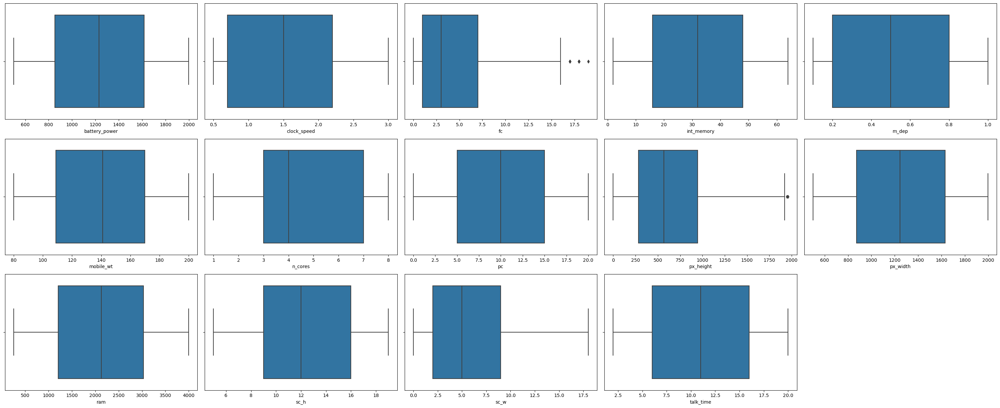

In [11]:
# Check outlier (numeric)
import seaborn as sns

hp_nums_temp = hp.drop(['blue', 'dual_sim', 'four_g', 'three_g', 'touch_screen', 'wifi', 'price_range'], axis=1)
hp_nums = []
for col in hp_nums_temp.columns:
    hp_nums.append(col)
    
plt.figure(figsize=(30, 20))
for i in range(len(hp_nums)):
    plt.subplot(5, 5, i+1)
    sns.boxplot(x=hp[hp_nums[i]])
    plt.tight_layout()

Ket: Terdapat 2 fitur numerik yang memiliki outlier yaitu fc dan px_height

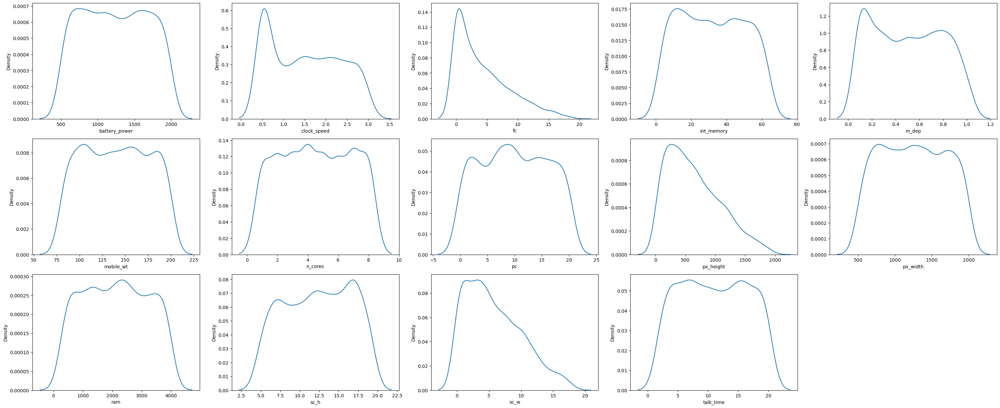

In [12]:
# Check distribution using KDE
plt.figure(figsize=(30, 20))
for i in range(len(hp_nums)):
    plt.subplot(5, 5, i+1)
    sns.kdeplot(data=hp, x=hp[hp_nums[i]])
    plt.tight_layout()

Ket: 
- Meskipun terdapat fitur yang *skewed*, beberapa fitur lainnya dapat diasumsikan normal
- Nilai outlier pada fitur fc dan px_height akan diubah menjadi median karena terdistribusi *right skewed*
- Nilai null pada fitur clock_speed akan diisi dengan mean
- Nilai null pada fitur int_memory akan diisi dengan mean
- Nilai null pada fitur m_dep akan diisi dengan mean
- Nilai null pada fitur ram akan diisi dengan mean
- Nilai null pada fitur talk_time akan diisi dengan mean
- Nilai null pada fitur touch_screen akan diisi dengan mode
- Nilai null pada fitur wifi akan diisi dengan mode

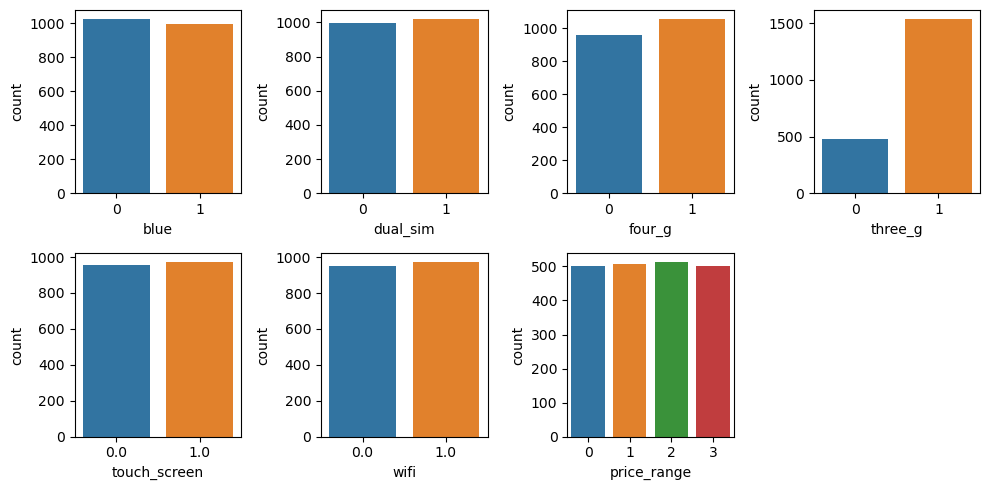

In [13]:
# Check distribution of ordinal data
hp_ord = []
for col in hp_ord_temp.columns:
    hp_ord.append(col)

plt.figure(figsize=(10, 5))
for i in range(len(hp_ord)):
    plt.subplot(2, 4, i+1)
    sns.countplot(data=hp, x=hp[hp_ord[i]])
    plt.tight_layout()

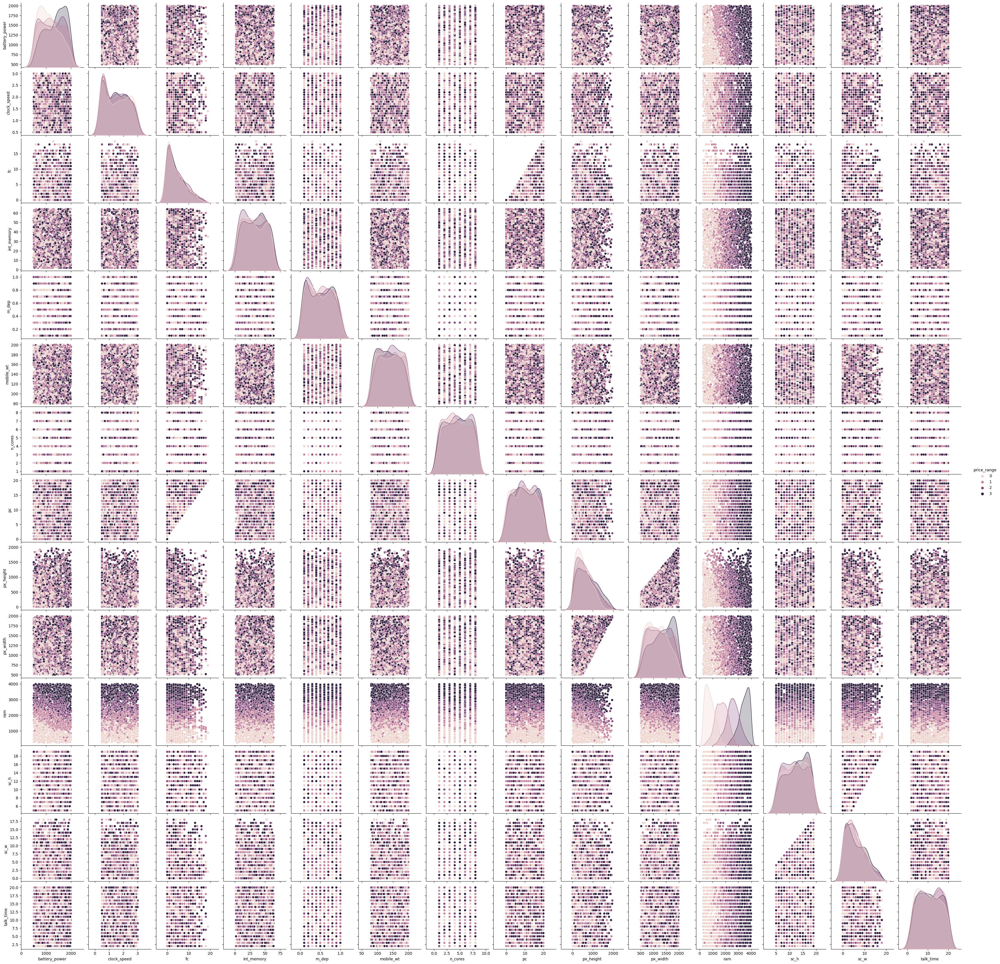

In [14]:
# Bivariate analysis using pairplot (numeric)
hp_nums_temp2 = hp.drop(['blue', 'dual_sim', 'four_g', 'three_g', 'touch_screen', 'wifi'], axis=1)
sns.pairplot(hp_nums_temp2, hue='price_range')
plt.show()

Ket: Dapat dilihat bahwa kombinasi dari setiap fitur berdasarkan jangkauan harga tersebar sangat acak

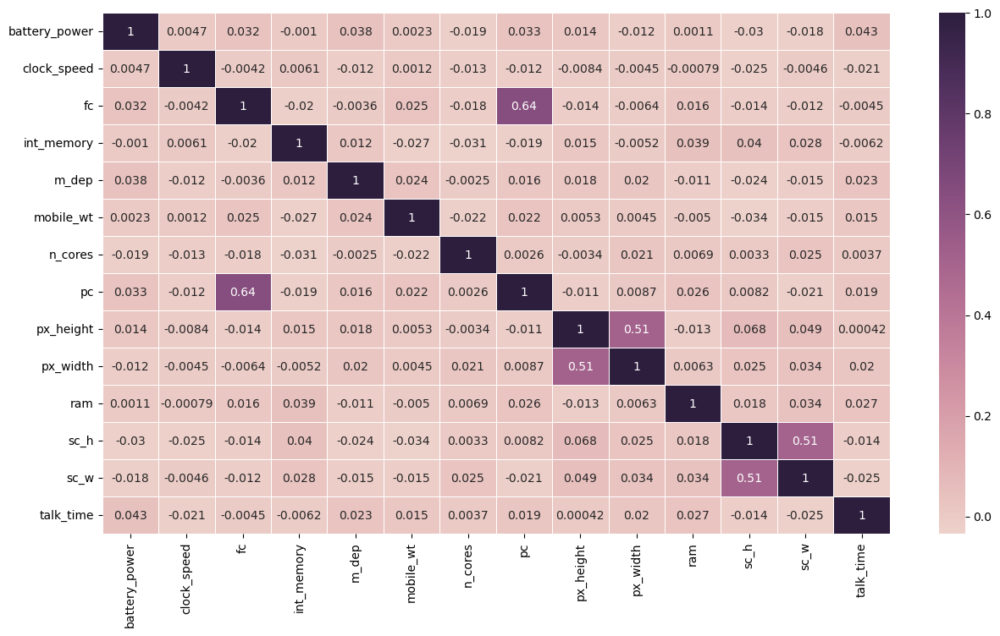

In [15]:
# Bivariate analysis using heatmap correlation (numeric)
plt.figure(figsize=(15,8))
sns.heatmap(hp_nums_temp.corr(), annot=True, linewidths=0.5, cmap=sns.cubehelix_palette(as_cmap=True));

Ket: Beberapa fitur yang cukup berkorelasi adalah pc dengan fc, px_width dengan px_height, dan sc_w dengan sc_h

2\. [3] Berdasarkan eksplorasi anda pada nomor 1, lakukan data preparation hingga data tersebut menurut anda cukup “clean” dan dapat memberikan hasil klasifikasi yang maksimal.

In [17]:
#drop duplicated data
hp = hp.drop_duplicates()

In [18]:
print('Jumlah data:', hp.shape[0])
print("Jumlah fitur:", hp.shape[1])

Jumlah data: 2000
Jumlah fitur: 21


In [19]:
#fill missing value
hp['clock_speed'].fillna(hp['clock_speed'].mean(), inplace=True)
hp['int_memory'].fillna(hp['int_memory'].mean(), inplace=True)
hp['m_dep'].fillna(hp['m_dep'].mean(), inplace=True)
hp['ram'].fillna(hp['ram'].mean(), inplace=True)
hp['talk_time'].fillna(hp['talk_time'].mean(), inplace=True)
hp['touch_screen'].fillna(hp['touch_screen'].mode()[0], inplace=True)
hp['wifi'].fillna(hp['wifi'].mode()[0], inplace=True)

In [20]:
hp.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 2000 entries, 0 to 2020
Data columns (total 21 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   battery_power  2000 non-null   int64  
 1   blue           2000 non-null   int64  
 2   clock_speed    2000 non-null   float64
 3   dual_sim       2000 non-null   int64  
 4   fc             2000 non-null   int64  
 5   four_g         2000 non-null   int64  
 6   int_memory     2000 non-null   float64
 7   m_dep          2000 non-null   float64
 8   mobile_wt      2000 non-null   int64  
 9   n_cores        2000 non-null   int64  
 10  pc             2000 non-null   int64  
 11  px_height      2000 non-null   int64  
 12  px_width       2000 non-null   int64  
 13  ram            2000 non-null   float64
 14  sc_h           2000 non-null   int64  
 15  sc_w           2000 non-null   int64  
 16  talk_time      2000 non-null   float64
 17  three_g        2000 non-null   int64  
 18  touch_sc

In [21]:
# Handling outlier
def cek_outlier(df, col):
    q1 = df[col].quantile(0.25)
    q3 = df[col].quantile(0.75)
    iqr = q3-q1
    lower = q1-(1.5*iqr)
    upper = q3+(1.5*iqr)
    
    df_min = (df[col] < lower).sum()
    df_max = (df[col] > upper).sum()
    return iqr, lower, upper, df_min, df_max

for col in hp_nums:
    print(col + ':')
    print(cek_outlier(hp, col)[3:5])

battery_power:
(0, 0)
clock_speed:
(0, 0)
fc:
(0, 18)
int_memory:
(0, 0)
m_dep:
(0, 0)
mobile_wt:
(0, 0)
n_cores:
(0, 0)
pc:
(0, 0)
px_height:
(0, 2)
px_width:
(0, 0)
ram:
(0, 0)
sc_h:
(0, 0)
sc_w:
(0, 0)
talk_time:
(0, 0)


In [22]:
hp['fc'] = np.where(hp['fc']>cek_outlier(hp,'fc')[2],hp['fc'].median(),
                        np.where(hp['fc']<cek_outlier(hp,'fc')[1],hp['fc'].median(),hp['fc']))

In [23]:
hp['px_height'] = np.where(hp['px_height']>cek_outlier(hp,'px_height')[2],hp['px_height'].median(),
                        np.where(hp['px_height']<cek_outlier(hp,'px_height')[1],hp['px_height'].median(),hp['px_height']))

In [24]:
# Aafter handling outlier
for col in hp_nums:
    print(col + ':')
    print(cek_outlier(hp, col)[3:5])

battery_power:
(0, 0)
clock_speed:
(0, 0)
fc:
(0, 0)
int_memory:
(0, 0)
m_dep:
(0, 0)
mobile_wt:
(0, 0)
n_cores:
(0, 0)
pc:
(0, 0)
px_height:
(0, 0)
px_width:
(0, 0)
ram:
(0, 0)
sc_h:
(0, 0)
sc_w:
(0, 0)
talk_time:
(0, 0)


3\. [3] Menurut Anda, apakah perlu dilakukan normalisasi terhadap data, atau cukup menggunakan data asli? Jika ya, bentuk normalisasi apa yang tepat digunakan pada data? Jelaskan secara singkat alasan Anda!


> Jawaban: Normalisasi data penting untuk dilakukan (terutama pada data yang memiliki banyak perbedaan skala/jarak) agar setiap data memiliki skala yang sama sehingga tidak menimbulkan bias saat melatih model akibat perbedaan jarak. Selain itu, normalisasi dapat meningkatkan kecepatan algoritma dalam mempelajari data sehingga interpretasi model akan lebih mudah didapatkan. Dalam kasus ini, normalisasi yang akan digunakan adalah MinMaxScaler karena dataset masih memiliki fitur yang tidak terdistribusi normal.

4\. [10] Sebelum data diproses lebih lanjut lakukan *feature selection* dengan memilih beberapa fitur yang paling optimal untuk mengklasifikasikan label target!

In [26]:
X_raw = hp.drop(['price_range'],axis=1)
y = hp['price_range']

In [27]:
selector = SelectKBest(f_classif, k=7)
X = selector.fit_transform(X_raw, y)

In [28]:
input_features = selector.feature_names_in_
selector.get_feature_names_out(input_features=input_features)

array(['battery_power', 'int_memory', 'mobile_wt', 'n_cores', 'px_height',
       'px_width', 'ram'], dtype=object)

5\. [6] Apa saja fitur-fitur yang terpilih hasil dari *feature selection*? Jelaskan strategi Anda dalam memilih fitur-fitur tersebut dan berikan analisis mengapa fitur tersebut cocok digunakan untuk mengklasifikasi label target!

> Jawaban: Fitur terbaik yang diperoleh berdasarkan perhitungan f_classif adalah battery_power, int_memory, mobile_wt, n_cores, px_height, px_width, dan ram. Alasan saya menggunakan metode tersebut adalah karena metode tersebut mengasumsikan hubungan yang linear antara fitur dengan target melalui nilai ANOVA F-value. <br> Fitur-fitur yang terpilih cocok untuk digunakan karena sudah merepresentasikan komponen *handphone* dimana hal tersebut dapat menentukan harga dari *handphone* yang akan ditentukan.

## [75] **Classification**

**Pada bagian ini Anda akan diminta untuk melakukan klasifikasi harga suatu mobile phone berdasarkan fitur-fitur yang sudah Anda pilih sebelumnya. Anda akan mencoba berbagai macam model klasifikasi seperti Decision Tree, Random Forest, Naive Bayes, dan K-nearest Neighbors untuk mencari model yang memiliki performa terbaik.**

### [3] Preparation

6\. [3] Buatlah model K-Fold Cross Validation yang akan digunakan untuk membagi dataset train dan test menjadi beberapa bagian (*fold*). Strategi ini akan Anda gunakan pada semua *classifier* dibandingkan dengan strategi sebelumnya yang hanya membagi data ke dalam data training dan testing menggunakan method `train_test_split`.

In [29]:
k = 5
kf = KFold(n_splits=k)

In [30]:
def kfoldcv(train, test):
    X_train, X_test = X[train], X[test]
    y_train, y_test = y.iloc[train], y.iloc[test]
    return X_train, X_test, y_train, y_test
    
def result(model, score, X_train, X_test, y_train, y_test):
    scaler = MinMaxScaler()
    X_train_scaled = scaler.fit_transform(X_train)
    X_test_scaled = scaler.transform(X_test)
    model.fit(X_train_scaled, y_train)
    pred_score = model.predict(X_test_scaled)
    acc = accuracy_score(pred_score, y_test)
    score.append(acc)
    
def result_no_scale(model, score, X_train_scaled, X_test_scaled, y_train, y_test):
    model.fit(X_train_scaled, y_train)
    pred_score = model.predict(X_test_scaled)
    acc = accuracy_score(pred_score, y_test)
    score.append(acc)

### [19] Decision Tree

7\. [4] Implementasikan model Decision Tree tanpa konfigurasi parameter apapun, serta berikan hasil evaluasinya!

In [31]:
dtc_score = []
for train_index, test_index in kf.split(X):
    kfoldcv(train_index, test_index)
    result(DecisionTreeClassifier(), dtc_score, kfoldcv(train_index, test_index)[0], kfoldcv(train_index, test_index)[1], kfoldcv(train_index, test_index)[2], kfoldcv(train_index, test_index)[3])

print(np.mean(dtc_score))

0.8160000000000001


8\. [4] Implementasikan model Decision Tree dengan memberikan parameter nilai `min_samples_leaf=50`; serta berikan hasil evaluasinya!

In [32]:
dtc2_score = []
for train_index, test_index in kf.split(X):
    kfoldcv(train_index, test_index)
    result(DecisionTreeClassifier(min_samples_leaf=50), dtc2_score, kfoldcv(train_index, test_index)[0], kfoldcv(train_index, test_index)[1], kfoldcv(train_index, test_index)[2], kfoldcv(train_index, test_index)[3])

print(np.mean(dtc2_score))

0.77


9\. [6] Bandingkan model yang dibuat pada soal nomor 7 dan nomor 8, manakah yang lebih baik? Berikan analisis Anda terkait bagaimana hubungan perubahan parameter tersebut dengan kualitas hasil klasifikasi!

> Jawaban: Model yang memiliki akurasi terbaik adalah model Decision Tree yang tidak memiliki parameter apa pun. Parameter min_samples_leaf=50 menandakan bahwa kita ingin tree yang dibuat memiliki leaf node sebanyak 50 yang mana hal ini bagus untuk permasalahan regresi (untuk smoothing).

10\. [5] Buatlah model yang memiliki performa yang lebih bagus dibanding kedua model sebelumnya! Anda dibebaskan untuk melakukan eksplorasi dalam mengkonfigurasi parameter yang dipakai.

In [130]:
dtc3_params = {'criterion': ['entropy', 'gini'],
               'max_depth': [8,10,13,16,20,23],
               'min_samples_leaf': [2,4,8,10,13,15]}
dtc3 = DecisionTreeClassifier()
dtc3_clf = GridSearchCV(estimator=dtc3, param_grid=dtc3_params, cv=kf)
dtc3_scaler = MinMaxScaler()
dtc3_score = []

for train_index, test_index in kf.split(X):
    kfoldcv(train_index, test_index)
    X_train_scaled_dtc3 = dtc3_scaler.fit_transform(kfoldcv(train_index, test_index)[0])
    X_test_scaled_dtc3 = dtc3_scaler.transform(kfoldcv(train_index, test_index)[1])
    dtc3_clf.fit(X_train_scaled_dtc3, kfoldcv(train_index, test_index)[2])
    result_no_scale(DecisionTreeClassifier(**dtc3_clf.best_params_), dtc3_score, X_train_scaled_dtc3, X_test_scaled_dtc3, kfoldcv(train_index, test_index)[2], kfoldcv(train_index, test_index)[3])
    
print(np.mean(dtc3_score))

0.8164999999999999


### [18] Random Forest

11\. [4] Implementasikan model Random Forest tanpa konfigurasi parameter apapun, serta berikan hasil evaluasinya!

In [131]:
rf_score = []
for train_index, test_index in kf.split(X):
    kfoldcv(train_index, test_index)
    result(RandomForestClassifier(), rf_score, kfoldcv(train_index, test_index)[0], kfoldcv(train_index, test_index)[1], kfoldcv(train_index, test_index)[2], kfoldcv(train_index, test_index)[3])

print(np.mean(rf_score))

0.8724999999999999


12\. [8] Implementasikan model Random Forest dengan parameter yang didapatkan dari hasil Hyperparameter Tuning, serta berikan hasil evaluasinya!

In [132]:
rf2_params = {'criterion': ['gini', 'entropy'],
               'max_depth' : [4,7,11,16,20],
               'max_features': ['auto', 'sqrt', 'log2'],
               'n_estimators': [200, 500]
              }
rf2 = RandomForestClassifier()
rf2_clf = GridSearchCV(estimator=rf2, param_grid=rf2_params, cv=kf)
rf2_scaler = MinMaxScaler()
rf2_score = []

for train_index, test_index in kf.split(X):
    kfoldcv(train_index, test_index)
    X_train_scaled_rf2 = rf2_scaler.fit_transform(kfoldcv(train_index, test_index)[0])
    X_test_scaled_rf2 = rf2_scaler.transform(kfoldcv(train_index, test_index)[1])
    rf2_clf.fit(X_train_scaled_rf2, kfoldcv(train_index, test_index)[2])
    result_no_scale(RandomForestClassifier(**rf2_clf.best_params_), rf2_score, X_train_scaled_rf2, X_test_scaled_rf2, kfoldcv(train_index, test_index)[2], kfoldcv(train_index, test_index)[3])
    
print(np.mean(rf2_score))

0.8799999999999999


13\. [6] Bandingkan model yang dibuat pada soal nomor 11 dan nomor 12, manakah yang lebih baik? Berikan analisis Anda terkait bagaimana hubungan perubahan parameter tersebut dengan kualitas hasil klasifikasi!

> Jawaban: Model yang memiliki akurasi terbaik adalah model Random Forest setelah dilakukan hyperparameter tuning. Hal tersebut tentunya berbanding lurus karena tujuan dari tuning adalah mencari parameter terbaik. Dengan demikian, nilai akurasi yang dihasilkan pun akan lebih besar karena menggunakan parameter terbaik.

### [16] Naive Bayes

14\. [4] Implementasikan model dari salah satu variasi Naive Bayes; serta berikan hasil evaluasinya!

In [33]:
# Gaussian
gnb_score = []
for train_index, test_index in kf.split(X):
    kfoldcv(train_index, test_index)
    result(GaussianNB(), gnb_score, kfoldcv(train_index, test_index)[0], kfoldcv(train_index, test_index)[1], kfoldcv(train_index, test_index)[2], kfoldcv(train_index, test_index)[3])

print(np.mean(gnb_score))

0.7809999999999999


15\. [6] Apa alasan dan pertimbangan Anda dalam memilih variasi tersebut dibandingkan variasi Naive Bayes lainnya? 

> Jawaban: Alasan saya menggunakan Gaussian Naive Bayes adalah karena dataset ini memiliki banyak fitur yang mendekati normal (terdistribusi gaussian) sehingga model tersebut diasumsikan akan cocok terhadap dataset ini.

16\. [6] Masing-masing variasi Naive Bayes dibuat khusus untuk menyesuaikan tipe data tertentu pada data yang digunakan. Jika data yang ada memiliki tipe fitur yang bervariasi (numerik, biner, kategorik, dll), apakah kita bisa menggunakan salah satu variasi algoritma saja? Bagaimana strategi Anda dalam menganani kasus tersebut?

> Jawaban: Tipe Naive Bayes yang paling memungkinkan untuk digunakan adalah Gaussian. Hal tersebut dapat kita lakukan karena model Gaussian berfokus pada distribusi data yang normal sehingga variasi data seperti biner/kategori dapat kita lakukan *feature encoding* dan bersamaan dengan data numerik dapat dilakukan transformasi data untuk menjadikannya normal. Dengan demikian, kita bisa saja hanya menggunakan salah satu variasi algoritma namun tentunya dengan memberikan asumsi yang jelas.

### [12] K-nearest Neighbors

17\. [4] Implementasikan model KNN dengan memberikan parameter nilai `n_neighbors=3`; serta berikan hasil evaluasinya!

In [34]:
knn_score = []
for train_index, test_index in kf.split(X):
    kfoldcv(train_index, test_index)
    result(KNeighborsClassifier(n_neighbors=3), knn_score, kfoldcv(train_index, test_index)[0], kfoldcv(train_index, test_index)[1], kfoldcv(train_index, test_index)[2], kfoldcv(train_index, test_index)[3])

print(np.mean(knn_score))

0.709


18\. [8] Implementasikan model KNN dengan parameter yang didapatkan dari hasil Hyperparameter Tuning, serta berikan hasil evaluasinya!

In [136]:
knn_params = [{'n_neighbors': [4,5,6,7,8,9,10]}]
knn2 = KNeighborsClassifier()
knn2_clf = GridSearchCV(knn2, knn_params, scoring="accuracy", cv=kf, verbose=1)
knn2_scaler = MinMaxScaler()
knn2_score = []

for train_index, test_index in kf.split(X):
    kfoldcv(train_index, test_index)
    X_train_scaled_knn2 = knn2_scaler.fit_transform(kfoldcv(train_index, test_index)[0])
    X_test_scaled_knn2 = knn2_scaler.transform(kfoldcv(train_index, test_index)[1])
    knn2_clf.fit(X_train_scaled_knn2, kfoldcv(train_index, test_index)[2])
    result_no_scale(KNeighborsClassifier(**knn2_clf.best_params_), knn2_score, X_train_scaled_knn2, X_test_scaled_knn2, kfoldcv(train_index, test_index)[2], kfoldcv(train_index, test_index)[3])
    
print(np.mean(knn2_score))

Fitting 5 folds for each of 7 candidates, totalling 35 fits
Fitting 5 folds for each of 7 candidates, totalling 35 fits
Fitting 5 folds for each of 7 candidates, totalling 35 fits
Fitting 5 folds for each of 7 candidates, totalling 35 fits
Fitting 5 folds for each of 7 candidates, totalling 35 fits
0.76


### [7] Analisis

19\. [7] Dari keempat variasi model (Decision Tree, Random Forest, Naive Bayes, dan KNN) yang sudah Anda coba, manakah model yang memiliki performa terbaik? Berikan analisis Anda!

> Jawaban: Model klasifikasi yang memiliki performa terbaik adalah Random Forest dengan parameter yang sudah melewati proses *hyperparameter tuning*. Hal ini dapat terjadi karena Random Forest merupakan salah satu model *bagging* yang mana *bagging* ini sendiri bertujuan untuk menggabungkan klasifikasi dari beberapa model dengan data yang lebih kecil (tidak terpusat pada data training yang lengkap) sehingga dapat mengatasi ketidakstabilan dengan mengurangi *variance error* (mencegah *overfitting*).